In [1]:
import pandas as pd
import numpy as np
import io
import math
from IPython import display
from matplotlib import cm
from matplotlib import gridspec
from matplotlib import pyplot as plt
import seaborn as sns
import plotly.express as px
import altair
altair.data_transformers.disable_max_rows()

# Set style & figures inline
sns.set()
%matplotlib inline

In [2]:
medical_conditions_df =  pd.read_csv('Covid19DataSet.csv')
confirmed_df =  pd.read_csv('time_series_covid19_confirmed_global.csv')
deaths_df =  pd.read_csv('time_series_covid19_deaths_global.csv')
recovered_df =  pd.read_csv('time_series_covid19_recovered_global.csv')

In [3]:
ccdf = confirmed_df.rename(columns={"Country/Region": "Location"}).groupby(['Location']).sum().drop(['Lat', 'Long'], axis=1)

ccdf.fillna(0,inplace=True)


crdf = recovered_df.rename(columns={"Country/Region": "Location"}).groupby(['Location']).sum().drop(['Lat', 'Long'], axis=1)

crdf.fillna(0,inplace=True)


cddf = deaths_df.rename(columns={"Country/Region": "Location"}).groupby(['Location']).sum().drop(['Lat', 'Long'], axis=1)

cddf.fillna(0,inplace=True)

cadf = pd.DataFrame(ccdf.iloc[:,:] - cddf.iloc[:,:] - crdf.iloc[:,:])



In [4]:
ccdf.head()

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,7/4/20,7/5/20,7/6/20,7/7/20,7/8/20,7/9/20,7/10/20,7/11/20,7/12/20,7/13/20
Location,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0,0,0,0,0,0,0,0,0,0,...,32672,32951,33190,33384,33594,33908,34194,34366,34451,34455
Albania,0,0,0,0,0,0,0,0,0,0,...,2819,2893,2964,3038,3106,3188,3278,3371,3454,3571
Algeria,0,0,0,0,0,0,0,0,0,0,...,15500,15941,16404,16879,17348,17808,18242,18712,19195,19689
Andorra,0,0,0,0,0,0,0,0,0,0,...,855,855,855,855,855,855,855,855,855,858
Angola,0,0,0,0,0,0,0,0,0,0,...,346,346,346,386,386,396,458,462,506,525


In [5]:
crdf.head()

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,7/4/20,7/5/20,7/6/20,7/7/20,7/8/20,7/9/20,7/10/20,7/11/20,7/12/20,7/13/20
Location,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0,0,0,0,0,0,0,0,0,0,...,19164,19366,20103,20179,20700,20847,20882,21135,21216,21254
Albania,0,0,0,0,0,0,0,0,0,0,...,1637,1657,1702,1744,1791,1832,1875,1881,1946,2014
Algeria,0,0,0,0,0,0,0,0,0,0,...,11181,11492,11884,12094,12329,12637,13124,13124,13743,14019
Andorra,0,0,0,0,0,0,0,0,0,0,...,800,800,800,800,802,802,803,803,803,803
Angola,0,0,0,0,0,0,0,0,0,0,...,108,108,108,117,117,117,117,118,118,118


In [6]:
cddf.head()

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,7/4/20,7/5/20,7/6/20,7/7/20,7/8/20,7/9/20,7/10/20,7/11/20,7/12/20,7/13/20
Location,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0,0,0,0,0,0,0,0,0,0,...,826,864,898,920,936,957,971,994,1010,1012
Albania,0,0,0,0,0,0,0,0,0,0,...,74,76,79,81,83,83,85,89,93,95
Algeria,0,0,0,0,0,0,0,0,0,0,...,946,952,959,968,978,988,996,1004,1011,1018
Andorra,0,0,0,0,0,0,0,0,0,0,...,52,52,52,52,52,52,52,52,52,52
Angola,0,0,0,0,0,0,0,0,0,0,...,19,19,19,21,21,22,23,23,26,26


In [7]:


cadf.head()

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,7/4/20,7/5/20,7/6/20,7/7/20,7/8/20,7/9/20,7/10/20,7/11/20,7/12/20,7/13/20
Location,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0,0,0,0,0,0,0,0,0,0,...,12682,12721,12189,12285,11958,12104,12341,12237,12225,12189
Albania,0,0,0,0,0,0,0,0,0,0,...,1108,1160,1183,1213,1232,1273,1318,1401,1415,1462
Algeria,0,0,0,0,0,0,0,0,0,0,...,3373,3497,3561,3817,4041,4183,4122,4584,4441,4652
Andorra,0,0,0,0,0,0,0,0,0,0,...,3,3,3,3,1,1,0,0,0,3
Angola,0,0,0,0,0,0,0,0,0,0,...,219,219,219,248,248,257,318,321,362,381


# Global Impact Study

In [8]:
# medical_conditions_df.info()


In [9]:
# country_cases = pd.DataFrame(medical_conditions_df, columns=['location','total_cases','total_deaths'])
# country_cases.index = country_cases['location']
# country_cases = country_cases.drop(['location'],axis=1)
# country_cases.fillna(0,inplace=True)
# country_cases

In [10]:
def generate_heatmap(data, title, color):
    # temp_df = pd.DataFrame(data['Cases'])
    temp_df = data.reset_index()
    fig = px.choropleth(temp_df, locations="Location",
                        color=np.log10(temp_df["Cases"]+1), # lifeExp is a column of gapminder
                        hover_name="Location", # column to add to hover information
                        hover_data=["Cases"],
                        color_continuous_scale=px.colors.sequential.Plasma,locationmode="country names")
    fig.update_geos(fitbounds="locations", visible=False)
    fig.update_layout(title_text=title)
    fig.update_coloraxes(colorbar_title="Log Scale",colorscale=color)
    # fig.to_image("Global Heat Map confirmed.png")
    fig.show()

    

In [11]:
# Confirmed Cases Global Data

data = ccdf.iloc[:,-1:]
data = data.rename(columns={data.columns[-1]:"Cases"})
title = "Confirmed Covid-19 Cases Heat Map (Log Scale)"
color = 'fall'

generate_heatmap(data,title ,color)

In [12]:
# Death Cases Global Data

data = cddf.iloc[:,-1:]
data = data.rename(columns={data.columns[-1]:"Cases"})
title = "Covid-19 Death Cases Heat Map (Log Scale)"
color = 'Reds'

generate_heatmap(data,title ,color)

In [13]:
# Recovered Cases Global Data

data = crdf.iloc[:,-1:]
data = data.rename(columns={data.columns[-1]:"Cases"})
title = "Covid-19 Recovered Cases Heat Map (Log Scale)"
color = 'Greens'

generate_heatmap(data,title ,color)

In [14]:
# Active Cases Global Data
data = cadf.iloc[:,-1:]

data = data.rename(columns={data.columns[-1]:"Cases"})
title = "Covid-19 Active Cases Heat Map (Log Scale)"
color = 'jet'

generate_heatmap(data,title ,color)

# Global Trend Analysis

In [15]:
# for analysis take top 50 countries

def pick_top_countries(data, top_country):
    data = data.sort_values(data.columns[-1], ascending= False)
    return data[:top_country]

top_country=50
ccdf1 = pick_top_countries(ccdf, top_country)
cadf1 = pick_top_countries(cadf, top_country)
crdf1 = pick_top_countries(crdf, top_country)
cddf1 = pick_top_countries(cddf, top_country)



In [16]:
# for plotting need to convert date into DateTime Index
def setDateTimeIndex(data):
    data = data.transpose()
    datetime_index = pd.DatetimeIndex(data.index)
    data.set_index(datetime_index, inplace=True)
    return data

In [17]:
ccdf1 = setDateTimeIndex(ccdf1)
cadf1 = setDateTimeIndex(cadf1)
crdf1 = setDateTimeIndex(crdf1)
cddf1 = setDateTimeIndex(cddf1)

In [18]:
# plot time series data
def plot_time_series_data(data, title_str, x_label, y_label, logy=False):
    ax = data.plot(figsize=(20,10), linewidth=2, marker='.', fontsize=20, logy=logy)
    ax.legend(ncol=3, loc='lower right')
    plt.xlabel(x_label, fontsize=20);
    plt.ylabel(y_label, fontsize=20);
    plt.title(title_str, fontsize=20);

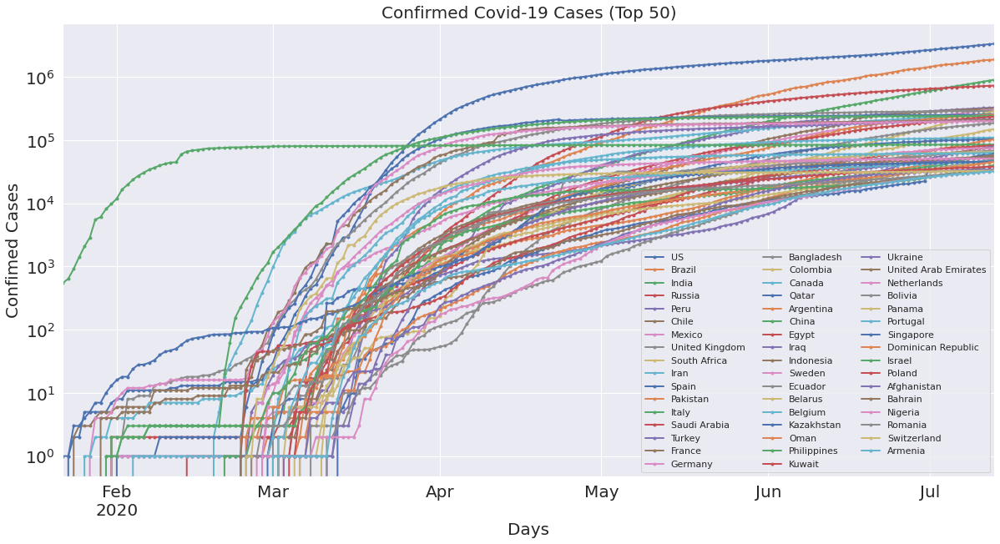

In [19]:
plot_time_series_data(ccdf1, 'Confirmed Covid-19 Cases (Top 50)', 'Days', 'Confimed Cases', logy=True)

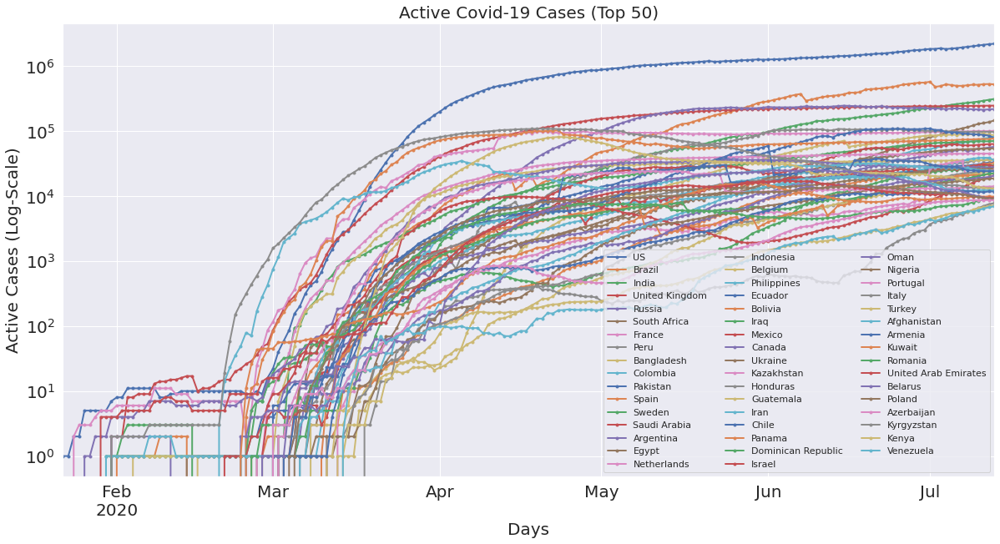

In [20]:
plot_time_series_data(cadf1, 'Active Covid-19 Cases (Top 50)', 'Days', 'Active Cases (Log-Scale)', logy=True)

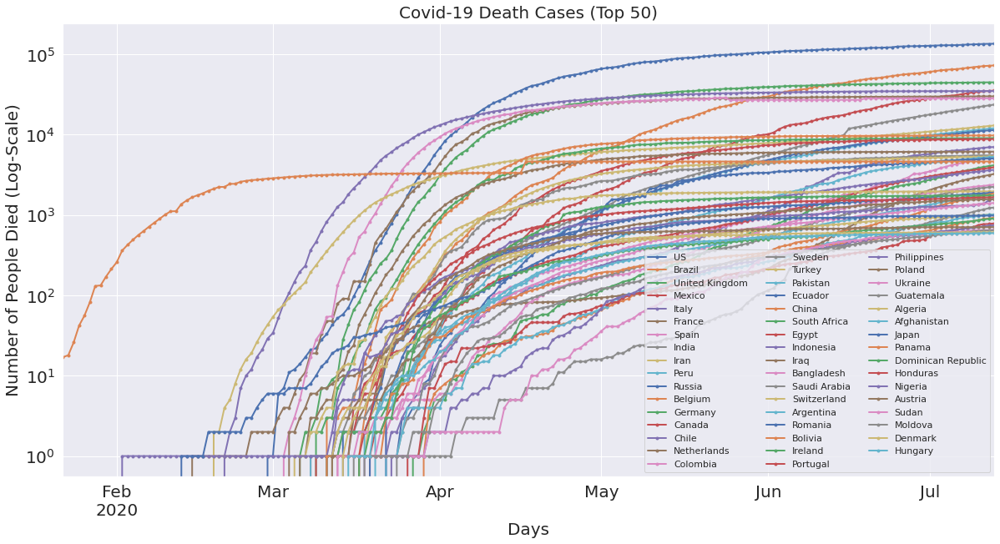

In [21]:
plot_time_series_data(cddf1, 'Covid-19 Death Cases (Top 50)', 'Days', 'Number of People Died (Log-Scale)', logy=True)

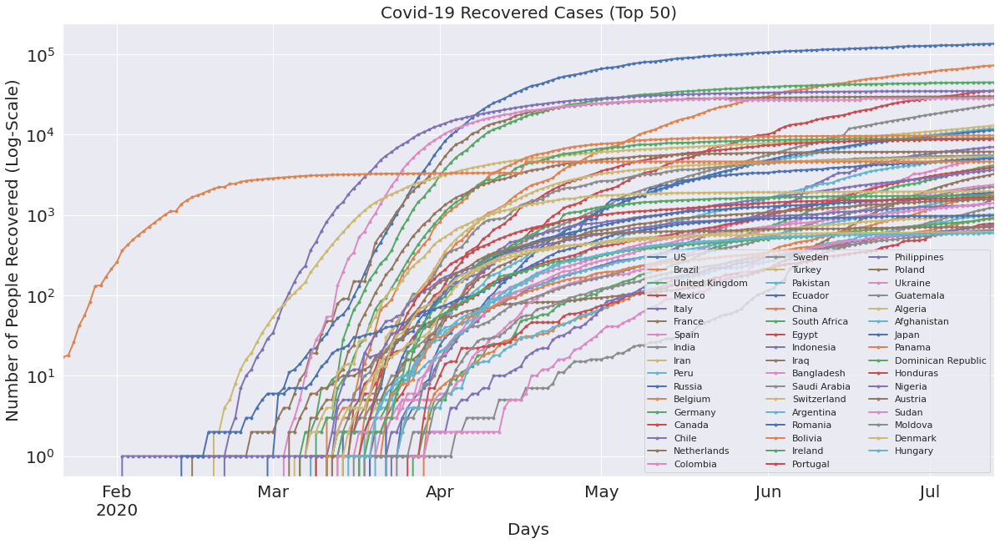

In [22]:
plot_time_series_data(cddf1, 'Covid-19 Recovered Cases (Top 50)', 'Days', 'Number of People Recovered (Log-Scale)', logy=True)

In all above plots our x-axis is not stable, all data need to be shifted at one point to look for trend, we are selecting this as 100 cases

In [23]:
# for certain countries x-coordinate (cases) mismatch, 
# so lets drop all columns where cases are below some threshold
def align_data_to_minval(data, min_val):
    
    # set values < min_val to NaNs
    for col in data.columns:
        data.loc[(data[col] < min_val),col] = None
    # Delete columns with all NaNs
    data.dropna(axis=1, how='all', inplace=True)
    # Reset index, drop date
    data = data.reset_index().drop(['index'], axis=1)
    # Shift each column to begin with first valid index i.e bigger than threshold
    for col in data.columns:
        data[col] = data[col].shift(-data[col].first_valid_index())
    return data

In [24]:
# delete all cases less than min_cases
min_cases = 100
tccdf = align_data_to_minval(ccdf1, min_cases)
tcadf = align_data_to_minval(cadf1, min_cases)
tcrdf = align_data_to_minval(crdf1, min_cases)
tcddf = align_data_to_minval(cddf1, min_cases)

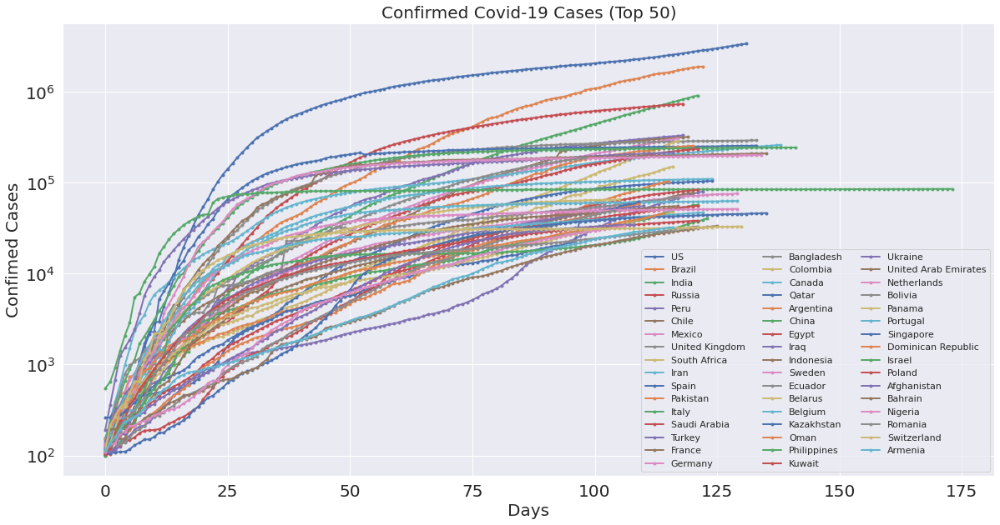

In [25]:
plot_time_series_data(tccdf, 'Confirmed Covid-19 Cases (Top 50)', 'Days', 'Confimed Cases', logy=True)

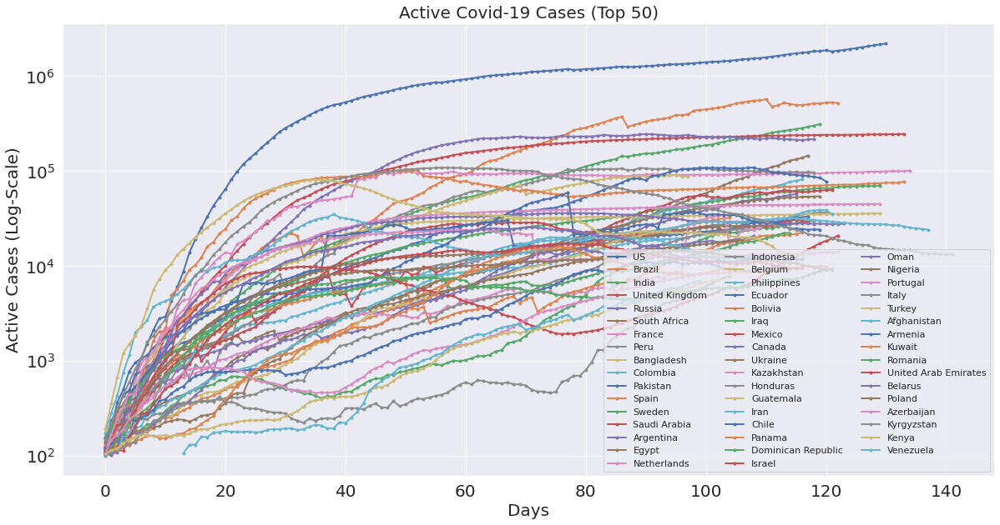

In [26]:
plot_time_series_data(tcadf, 'Active Covid-19 Cases (Top 50)', 'Days', 'Active Cases (Log-Scale)', logy=True)

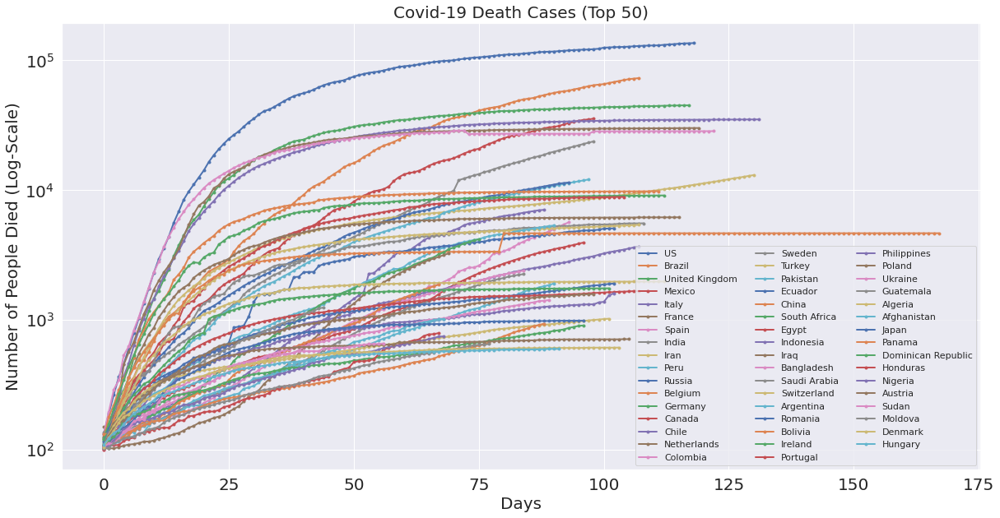

In [27]:
plot_time_series_data(tcddf, 'Covid-19 Death Cases (Top 50)', 'Days', 'Number of People Died (Log-Scale)', logy=True)

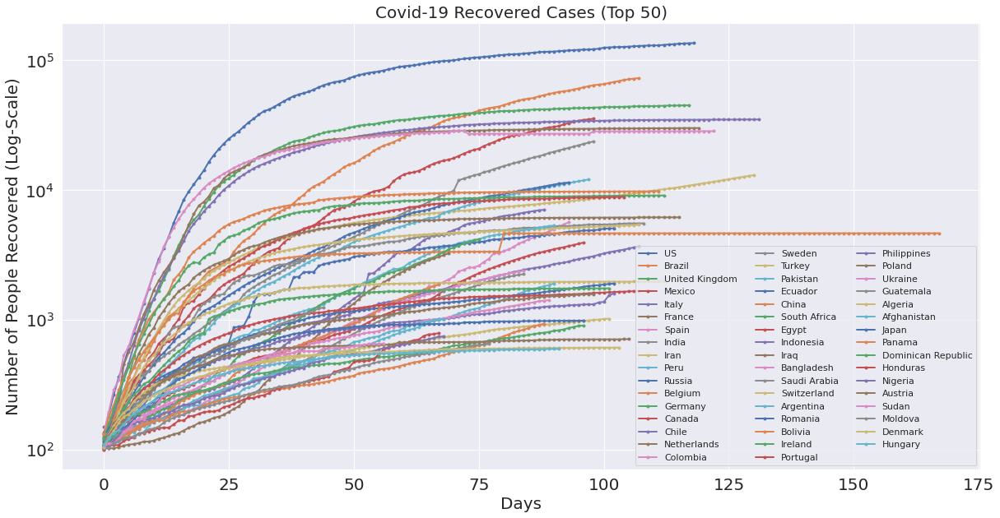

In [28]:
plot_time_series_data(tcddf, 'Covid-19 Recovered Cases (Top 50)', 'Days', 'Number of People Recovered (Log-Scale)', logy=True)

# Interactive Plotting 

In [29]:
# Interactive ALTAIR Tool for Plotting
def interactive_plot(data, xlabel, ylabel):
    daywise_data = data.reset_index().melt(id_vars='index', value_name=ylabel).rename(columns={'index':xlabel})
    # start selection based on region
    selection = altair.selection_single(fields=['Location'])
    
    color = altair.condition(selection,altair.Color('Location:N'),altair.value('lightgray'))
    # Base altair plot 
    base = altair.Chart(daywise_data).mark_line(strokeWidth=4, opacity=0.7).encode(
        x=altair.X(xlabel),
        y=altair.Y(ylabel, scale=altair.Scale(type='log')),
        color='Location',
        tooltip=['Location', xlabel,ylabel]
    ).properties(width=700, height=500)

    # Chart
    chart = base.encode(
      color=altair.condition(selection, 'Location:N', altair.value('lightgray'))
    ).add_selection(selection)

    # Overlay
    overlay = base.encode(
        color='Location',
      opacity=altair.value(0.5),
      tooltip=['Location:N', 'Name:N']
    ).transform_filter(selection)

    # Sum em up!
    return chart + overlay

In [30]:
interactive_plot(tccdf, 'Days', 'TotalCases')

alt.LayerChart(...)

In [31]:
interactive_plot(tcadf, 'Days', 'ActiveCases')

alt.LayerChart(...)

In [32]:
interactive_plot(tcrdf, 'Days', 'Recovered')

alt.LayerChart(...)

In [33]:
interactive_plot(tcddf, 'Days', 'Deaths')

alt.LayerChart(...)

# Top 5 Most Affected Countries with Max Death Toll

We will perform further analysis on top 5 most affected countries in terms of death toll. In our analysis we will first perform plotting and then we will use forcasting for these countries. Meanwhile we will also discuss the medical and polytical aspects of these countries to fight the Covid-19 epidemic.

In [34]:
top_country=5

cddf2 = pick_top_countries(cddf, top_country)

Region_OF_INTREST = cddf2.transpose().columns.values.tolist()

Region_OF_INTREST

# countries selected are 'US', 'Brazil', 'United Kingdom', 'Mexico', 'Italy'

['US', 'Brazil', 'United Kingdom', 'Mexico', 'Italy']

In [35]:
selected_confirmed_cases = ccdf.transpose()[Region_OF_INTREST].transpose()
selected_death_cases = cddf.transpose()[Region_OF_INTREST].transpose()
selected_recovered_cases = crdf.transpose()[Region_OF_INTREST].transpose()
selected_active_cases = cadf.transpose()[Region_OF_INTREST].transpose()

ccdf3 = setDateTimeIndex(selected_confirmed_cases)
cadf3 = setDateTimeIndex(selected_death_cases)
crdf3 = setDateTimeIndex(selected_recovered_cases)
cddf3 = setDateTimeIndex(selected_active_cases)
selected_confirmed_cases.head()

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,7/4/20,7/5/20,7/6/20,7/7/20,7/8/20,7/9/20,7/10/20,7/11/20,7/12/20,7/13/20
Location,,,,,,,,,,,,,,,,,,,,,
US,1,1,2,2,5,5,5,5,5,7,...,2841241,2891124,2936077,2996098,3054699,3117946,3184573,3245925,3304942,3364157
Brazil,0,0,0,0,0,0,0,0,0,0,...,1577004,1603055,1623284,1668589,1713160,1755779,1800827,1839850,1864681,1884967
United Kingdom,0,0,0,0,0,0,0,0,0,2,...,286412,286931,287290,287874,288511,289154,289678,290504,291154,291691
Mexico,0,0,0,0,0,0,0,0,0,0,...,252165,256848,261750,268008,275003,282283,289174,295268,299750,304435
Italy,0,0,0,0,0,0,0,0,0,2,...,241419,241611,241819,241956,242149,242363,242639,242827,243061,243230


In [36]:
# delete all cases less than min_cases
min_cases = 10
tccdf = align_data_to_minval(ccdf3, min_cases)
tcadf = align_data_to_minval(cadf3, min_cases)
tcrdf = align_data_to_minval(crdf3, min_cases)
tcddf = align_data_to_minval(cddf3, min_cases)

In [37]:
interactive_plot(tccdf, 'Days', 'TotalCases')

alt.LayerChart(...)

In [38]:
interactive_plot(tcadf, 'Days', 'ActiveCases')

alt.LayerChart(...)

In [39]:
interactive_plot(tcrdf, 'Days', 'Recovered')

alt.LayerChart(...)

In [40]:
interactive_plot(tcddf, 'Days', 'Deaths')

alt.LayerChart(...)

# Forcasting 

**Data Prepration**

In [41]:
# medical_conditions_df.head(5)

In [42]:
# mddf = medical_conditions_df.rename(columns={"location": "Location"}).drop(['iso_code', 'continent'], axis=1)#.groupby(['Location']).sum()
# mddf.set_index()
# mddf.fillna(0,inplace=True)

In [43]:
# mddf.head()

In [44]:
confirmed_cases = selected_confirmed_cases.sum(axis=0)
confirmed_cases.index = pd.to_datetime(confirmed_cases.index)

death_cases = selected_death_cases.sum(axis=0)
death_cases.index = pd.to_datetime(death_cases.index)

recovered_cases = selected_recovered_cases.sum(axis=0)
recovered_cases.index = pd.to_datetime(recovered_cases.index)

active_cases = selected_active_cases.sum(axis=0)
active_cases.index = pd.to_datetime(active_cases.index)


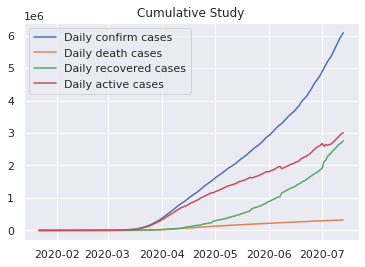

In [45]:
plt.plot(confirmed_cases, label="Daily confirm cases")
plt.plot(death_cases, label="Daily death cases")
plt.plot(recovered_cases, label="Daily recovered cases")
plt.plot(active_cases, label="Daily active cases")
plt.legend();
plt.title("Cumulative Study");

In [46]:
confirmed_cases = confirmed_cases.diff().fillna(confirmed_cases[0]).transpose().astype(np.float64)
death_cases = death_cases.diff().fillna(death_cases[0]).transpose().astype(np.float64)
recovered_cases = recovered_cases.diff().fillna(recovered_cases[0]).transpose().astype(np.float64)
active_cases = active_cases.diff().fillna(active_cases[0]).transpose().astype(np.float64)


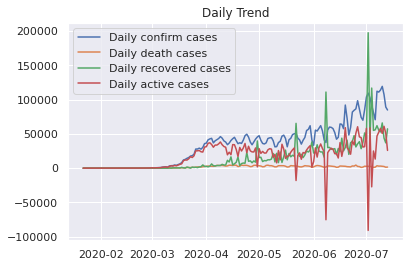

In [47]:
plt.plot(confirmed_cases, label="Daily confirm cases")
plt.plot(death_cases, label="Daily death cases")
plt.plot(recovered_cases, label="Daily recovered cases")
plt.plot(active_cases, label="Daily active cases")
plt.legend();
plt.title("Daily Trend");

In [48]:
import torch
from torch import nn, optim

from sklearn.preprocessing import MinMaxScaler
from tqdm import tqdm
from pandas.plotting import register_matplotlib_converters

RANDOM_SEED = 100
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)

# Covid19 Forecasting

In [49]:
def create_data_sequences(data, seq_length):
    xs = []
    ys = []
    for i in range(len(data)-seq_length-1):
        x = data[i:(i+seq_length)]
        y = data[i+seq_length]
        xs.append(x)
        ys.append(y)

    return np.array(xs), np.array(ys)

In [50]:
def data_prepration(data):
    
    
    # Select 25 % test data
    test_data_size = np.int(0.25*len(data))
    train_data = data[:-test_data_size]
    test_data = data[-test_data_size:]

    # Normalize dataset with MinMaxScalar
    scaler = MinMaxScaler()
    scaler = scaler.fit(np.expand_dims(train_data, axis=1))
    train_data = scaler.transform(np.expand_dims(train_data, axis=1))
    test_data = scaler.transform(np.expand_dims(test_data, axis=1))
    
    # create sequence as per testdata size
    seq_length = np.int(test_data_size/2)
    
    

    X_train, y_train = create_data_sequences(train_data, seq_length)
    X_test, y_test = create_data_sequences(test_data, seq_length)

    # convert numpy to torch
    X_train = torch.from_numpy(X_train).float()
    y_train = torch.from_numpy(y_train).float()
    X_test = torch.from_numpy(X_test).float()
    y_test = torch.from_numpy(y_test).float()
    
    return seq_length, train_data, test_data, scaler, X_train, y_train, X_test, y_test

In [51]:
class CasePredictor(nn.Module):

  def __init__(self, n_features, n_hidden, seq_len, n_layers=2):
    super(CasePredictor, self).__init__()

    self.n_hidden = n_hidden
    self.seq_len = seq_len
    self.n_layers = n_layers

    self.lstm = nn.LSTM(
      input_size=n_features,
      hidden_size=n_hidden,
      num_layers=n_layers,
      dropout=0.5
    )

    self.linear = nn.Linear(in_features=n_hidden, out_features=1)

  def reset_hidden_state(self):
    self.hidden = (
        torch.zeros(self.n_layers, self.seq_len, self.n_hidden),
        torch.zeros(self.n_layers, self.seq_len, self.n_hidden)
    )

  def forward(self, sequences):
    lstm_out, self.hidden = self.lstm(
      sequences.view(len(sequences), self.seq_len, -1),
      self.hidden
    )
    last_time_step = \
      lstm_out.view(self.seq_len, len(sequences), self.n_hidden)[-1]
    y_pred = self.linear(last_time_step)
    return y_pred

In [52]:
def train_model(  model,   train_data,   train_labels,   test_data=None,   test_labels=None):
    
  loss_fn = torch.nn.MSELoss()#reduction='sum'

  optimiser = torch.optim.Adam(model.parameters(), lr=0.001)
  num_epochs = 150

  train_hist = np.zeros(num_epochs)
  test_hist = np.zeros(num_epochs)
  
    # run training epoch

  for t in range(num_epochs):
    model.reset_hidden_state() # handle hidden state

    y_pred = model(X_train) # Predict Label

    loss = loss_fn(y_pred.float(), y_train) # Calculate Loss

    if test_data is not None:# Evaluation 
      with torch.no_grad(): # stop backpropagation
        y_test_pred = model(X_test)# Predict Label
        test_loss = loss_fn(y_test_pred.float(), y_test) # Calulate test time loss
      test_hist[t] = test_loss.item()

      if t % 10 == 0:  
        print(f'Epoch {t} training loss: {loss.item()} test loss: {test_loss.item()}')
    elif t % 10 == 0:
      print(f'Epoch {t} training loss: {loss.item()}')

    train_hist[t] = loss.item()
    
    optimiser.zero_grad() # calculate gradient

    loss.backward() # Backpropagate

    optimiser.step() # adjust waights
  
  return model.eval(), train_hist, test_hist


In [53]:
# Prepare Data

seq_length, train_data, test_data, scaler, X_train, y_train, X_test, y_test = data_prepration(confirmed_cases)


In [54]:

# Create a forecase model
forecast_model = CasePredictor(n_features=1, n_hidden=100, seq_len=seq_length, n_layers=2)



Epoch 0 training loss: 0.29766806960105896 test loss: 2.370680570602417
Epoch 10 training loss: 0.11794811487197876 test loss: 0.735252857208252
Epoch 20 training loss: 0.1006939709186554 test loss: 1.281247854232788
Epoch 30 training loss: 0.09828061610460281 test loss: 1.0497862100601196
Epoch 40 training loss: 0.09689515084028244 test loss: 1.1047451496124268
Epoch 50 training loss: 0.0967835932970047 test loss: 1.1267430782318115
Epoch 60 training loss: 0.09822586178779602 test loss: 1.077254295349121
Epoch 70 training loss: 0.097772516310215 test loss: 1.1382710933685303
Epoch 80 training loss: 0.09743425995111465 test loss: 1.1024824380874634
Epoch 90 training loss: 0.0964706689119339 test loss: 1.1041467189788818
Epoch 100 training loss: 0.09639617800712585 test loss: 1.0963003635406494
Epoch 110 training loss: 0.09847547113895416 test loss: 1.1044352054595947
Epoch 120 training loss: 0.09576570987701416 test loss: 1.0883418321609497
Epoch 130 training loss: 0.09498395770788193 

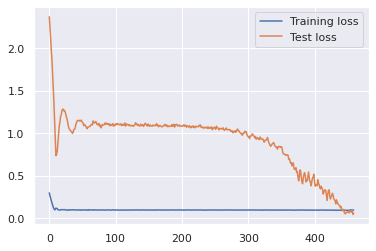

In [55]:
# Training


forecast_model, train_hist, test_hist = train_model(  forecast_model, X_train, y_train, X_test, y_test )

plt.plot(train_hist, label="Training loss")

plt.plot(test_hist, label="Test loss")

plt.legend();



In [56]:
# torch.save(forecast_model,'covid_forecast_model.pt')


In [57]:
# lets forcast all test values to compare with ground
def forecasting(model, data, seq_length, DAYS_TO_PREDICT=None):
    
    if DAYS_TO_PREDICT==None:
        with torch.no_grad():
          test_seq = data[:1]
          preds = []
          for _ in range(len(data)):
            y_test_pred = model(test_seq)
            pred = torch.flatten(y_test_pred).item()
            preds.append(pred)
            new_seq = test_seq.numpy().flatten()
            new_seq = np.append(new_seq, [pred])
            new_seq = new_seq[1:]
            test_seq = torch.as_tensor(new_seq).view(1, seq_length, 1).float()

    else:
        with torch.no_grad():
          test_seq = data[:1]
          preds = []
          for _ in range(DAYS_TO_PREDICT):
            y_test_pred = model(test_seq)
            pred = torch.flatten(y_test_pred).item()
            preds.append(pred)
            new_seq = test_seq.numpy().flatten()
            new_seq = np.append(new_seq, [pred])
            new_seq = new_seq[1:]
            test_seq = torch.as_tensor(new_seq).view(1, seq_length, 1).float()
            
    return test_seq, preds

In [58]:
# Remap predicted test values to origional format (Undo Normalization) as well as GT

test_seq, preds = forecasting(forecast_model, X_test, seq_length)

true_cases = scaler.inverse_transform(np.expand_dims(y_test.flatten().numpy(), axis=0)).flatten()

predicted_cases = scaler.inverse_transform(np.expand_dims(preds, axis=0)).flatten()


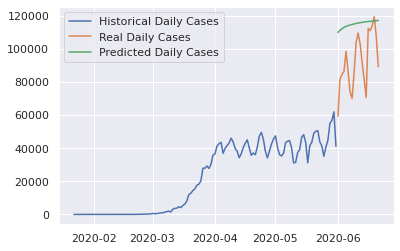

In [59]:
# Lets plot the predicted Results and GT

plt.plot(confirmed_cases.index[:len(train_data)], scaler.inverse_transform(train_data).flatten(),label='Historical Daily Cases')

plt.plot(confirmed_cases.index[len(train_data):len(train_data) + len(true_cases)], true_cases,label='Real Daily Cases')

plt.plot(confirmed_cases.index[len(train_data):len(train_data) + len(true_cases)], predicted_cases, label='Predicted Daily Cases')

plt.legend();

## FORECASTING

Lets forecast covid cases for next 60 days 

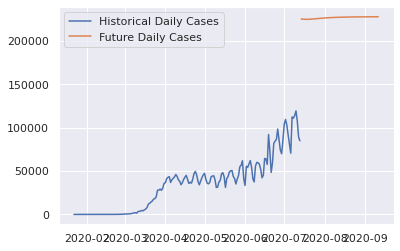

In [60]:
scaler = MinMaxScaler()

scaler = scaler.fit(np.expand_dims(confirmed_cases, axis=1))

all_data = scaler.transform(np.expand_dims(confirmed_cases, axis=1))

X_all, y_all = create_data_sequences(all_data, seq_length)

X_all = torch.from_numpy(X_all).float()

y_all = torch.from_numpy(y_all).float()

DAYS_TO_PREDICT = 60

test_seq, preds = forecasting(forecast_model, X_test, seq_length, DAYS_TO_PREDICT)

predicted_cases = scaler.inverse_transform(np.expand_dims(preds, axis=0)).flatten()

predicted_index = pd.date_range(start=confirmed_cases.index[-1],periods=DAYS_TO_PREDICT + 1,closed='right')

predicted_cases = pd.Series(data=predicted_cases,index=predicted_index)

plt.plot(confirmed_cases, label='Historical Daily Cases')

plt.plot(predicted_cases, label='Future Daily Cases')

plt.legend();

# Forecast Death

In [61]:
# Generate Data
seq_length, train_data, test_data, scaler, X_train, y_train, X_test, y_test = data_prepration(death_cases)


In [62]:
# Create a forecase model
death_forecast_model = CasePredictor(n_features=1, n_hidden=512, seq_len=seq_length, n_layers=2)

Epoch 0 training loss: 0.29737937450408936 test loss: 0.3077729642391205
Epoch 10 training loss: 0.1728181391954422 test loss: 0.14178001880645752
Epoch 20 training loss: 0.13028626143932343 test loss: 0.03586667776107788
Epoch 30 training loss: 0.12633726000785828 test loss: 0.057099469006061554
Epoch 40 training loss: 0.12512752413749695 test loss: 0.041571829468011856
Epoch 50 training loss: 0.12469790130853653 test loss: 0.04806240275502205
Epoch 60 training loss: 0.12501181662082672 test loss: 0.0431465320289135
Epoch 70 training loss: 0.12300894409418106 test loss: 0.04313436150550842
Epoch 80 training loss: 0.12323548644781113 test loss: 0.04224183037877083
Epoch 90 training loss: 0.1217883974313736 test loss: 0.03849417343735695
Epoch 100 training loss: 0.12451975047588348 test loss: 0.042307011783123016
Epoch 110 training loss: 0.12140963226556778 test loss: 0.043213970959186554
Epoch 120 training loss: 0.12132211029529572 test loss: 0.03616709262132645
Epoch 130 training loss

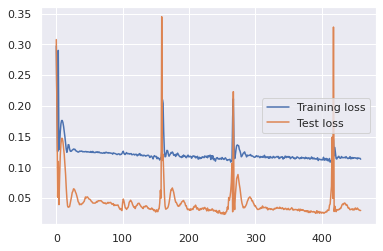

In [63]:
# Training Death Forecase Model


forecast_model, train_hist, test_hist = train_model(  death_forecast_model, X_train, y_train, X_test, y_test )



plt.plot(train_hist, label="Training loss")

plt.plot(test_hist, label="Test loss")

plt.legend();


In [64]:
torch.save(death_forecast_model,'death_forecast_model.pt')


/home/dnaish/.local/lib/python3.6/site-packages/torch/serialization.py:402: UserWarning:

Couldn't retrieve source code for container of type CasePredictor. It won't be checked for correctness upon loading.



In [65]:
# Remap predicted test values to origional format (Undo Normalization) as well as GT

test_seq, preds = forecasting(forecast_model, X_test, seq_length)

true_cases = scaler.inverse_transform(np.expand_dims(y_test.flatten().numpy(), axis=0)).flatten()

predicted_cases = scaler.inverse_transform(np.expand_dims(preds, axis=0)).flatten()

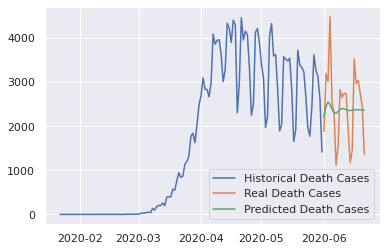

In [66]:
# Lets plot the predicted Results and GT

plt.plot(confirmed_cases.index[:len(train_data)], scaler.inverse_transform(train_data).flatten(),label='Historical Death Cases')

plt.plot(confirmed_cases.index[len(train_data):len(train_data) + len(true_cases)], true_cases,label='Real Death Cases')

plt.plot(confirmed_cases.index[len(train_data):len(train_data) + len(true_cases)], predicted_cases, label='Predicted Death Cases')

plt.legend();

# Forecast

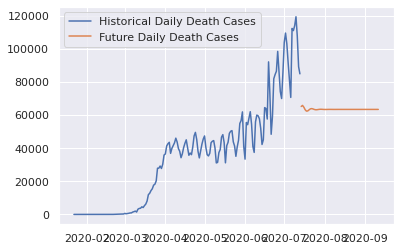

In [67]:
scaler = MinMaxScaler()

scaler = scaler.fit(np.expand_dims(confirmed_cases, axis=1))

all_data = scaler.transform(np.expand_dims(confirmed_cases, axis=1))

X_all, y_all = create_data_sequences(all_data, seq_length)

X_all = torch.from_numpy(X_all).float()

y_all = torch.from_numpy(y_all).float()

DAYS_TO_PREDICT = 60

test_seq, preds = forecasting(death_forecast_model, X_test, seq_length, DAYS_TO_PREDICT)

predicted_cases = scaler.inverse_transform(np.expand_dims(preds, axis=0)).flatten()

predicted_index = pd.date_range(start=confirmed_cases.index[-1],periods=DAYS_TO_PREDICT + 1,closed='right')

predicted_cases = pd.Series(data=predicted_cases,index=predicted_index)

plt.plot(confirmed_cases, label='Historical Daily Death Cases')

plt.plot(predicted_cases, label='Future Daily Death Cases')

plt.legend();

# Political and Ground Realities

In [68]:
country_cases = pd.DataFrame(medical_conditions_df, columns=["date", "location","total_cases","total_deaths","handwashing_facilities","hospital_beds_per_thousand"])
country_cases.fillna(0,inplace=True)
country_data =  country_cases.groupby(["location"]).sum()
df_countries_cases = pd.DataFrame(country_data)
country_cases.head()

,date,location,total_cases,total_deaths,handwashing_facilities,hospital_beds_per_thousand
0,31-12-19,Afghanistan,0.0,0.0,37.746,0.5
1,01-01-20,Afghanistan,0.0,0.0,37.746,0.5
2,02-01-20,Afghanistan,0.0,0.0,37.746,0.5
3,03-01-20,Afghanistan,0.0,0.0,37.746,0.5
4,04-01-20,Afghanistan,0.0,0.0,37.746,0.5


In [69]:

df_countries_cases.describe()


,total_cases,total_deaths,handwashing_facilities,hospital_beds_per_thousand
count,2.120000e+02,2.120000e+02,212.000000,212.000000
mean,4.996530e+06,2.896349e+05,2975.883892,353.230014
std,3.793509e+07,2.207644e+06,4786.515836,428.863546
min,0.000000e+00,0.000000e+00,0.000000,0.000000
25%,1.664750e+04,4.365000e+02,0.000000,52.200000
50%,1.124900e+05,2.392500e+03,0.000000,226.050000
75%,9.962388e+05,2.009450e+04,4807.057000,495.375000
max,5.298052e+08,3.071596e+07,17921.600000,2479.500000
